## SORBONNE UNIVERSITY - M2 DAC - 2023 - 2024
## RDFIA - Practical 2_D : GANs and CGANs
## Implemented by: Allaa BOUTALEB (21112734) & Samy NEHLIL (21113646)


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torchvision.transforms as transforms
import torchvision.utils
from torchvision.utils import make_grid

import torchvision.datasets

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,6)

from tqdm import tqdm

from torchvision.utils import make_grid
from PIL import Image
import numpy as np

import matplotlib
from matplotlib.animation import ArtistAnimation
matplotlib.rcParams['animation.embed_limit'] = 2**128
from IPython.display import HTML

from datetime import datetime
import os
import random

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [2]:
device

device(type='cuda')

In [3]:
# Fixing the seeds For Reproducibility

random.seed(0)
torch.manual_seed(0)
np.random.seed(0)

# Introduction to Generative Adversarial Networks (GANs)

In this notebook you will build a GAN from scratch, grossly following the DCGAN architecture.

**Goals:**


1.   Build a GAN arhictecture from scratch
2.   Write the GAN loss function and train GAN from scratch
3.   Have experience with some of the instability problems inherent with training GANs.
4.   [Bonus] Extend the unconditional GAN into a conditional GAN.



## 1. Getting Started

We will work with the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset. It contains 60,000 images size 28x28 of handwritten digits, from 0 to 9.

## 1. Dataloading

### 1.1 Define some hyperparameters and transforms


In [10]:
batch_size = 128 # Images per batch

# Resize to 32x32 for easier upsampling/downsampling
mytransform = transforms.Compose([transforms.Resize(32),
                                  transforms.ToTensor(),
                                 transforms.Normalize((.5), (.5))]) # normalize between [-1, 1] with tanh activation

mnist_train = torchvision.datasets.MNIST(root='.', download=True, transform=mytransform)

In [11]:
len(mnist_train)

60000

In [12]:
dataloader = DataLoader(dataset=mnist_train,
                         batch_size=batch_size,
                         shuffle=True)

In [13]:
# plot some images
real_batch, real_labels = next(iter(dataloader))

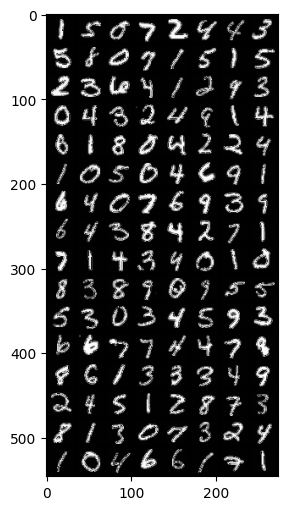

In [14]:
plt.imshow(transforms.ToPILImage()(make_grid(real_batch)))

# 2. Model Architecture

We will follow the general architecture of a DCGAN - or deep convolutional GAN. This [influential paper](https://arxiv.org/pdf/1511.06434v2.pdf) produced much of the foundation for modern GANs and how to train them.

(GANs are notoriously **hard** to train, we will try to get a feeling why in this notebook.)


Complete the function `get_upscaling_block`. Then, use the function to define our model defined as follows:

Input: Random "noise" $z$ shaped `[n_batch, n_z]`

Output: Generated image size `[n_batch, 1, 32, 32]` in range [-1, 1]

1. Reshape z into `[n_batch, n_z, 1, 1]` to make it into an "image"
2. First upscaling block $\rightarrow$ `[n_batch, ngf*4, 4, 4]`
3. Second upscaling block $\rightarrow$ `[n_batch, ngf*2, 8, 8]`
4. Third upscaling block $\rightarrow$ `[n_batch, ngf, 16, 16]`
5. Fourth (and last) upscaling block $\rightarrow$ `[n_batch, 1, 32, 32]`

## 2.1. The Generator



The generator performs subsequent upsampling blocks, transforming a latent vector shaped [batch_size, latent_size] into an image (values in [-1, 1]).

The generator block will consists of:
- Transpose Convolution
- Batch Norm
- ReLU

In [15]:
import torch.nn as nn

def get_upscaling_block(channels_in, channels_out, kernel, stride, padding, last_layer=False):
    """
    Creates a block for the generator that upscales the input.
    
    Args:
    - channels_in (int): Number of input channels.
    - channels_out (int): Number of output channels.
    - kernel (int): Kernel size for the convolution.
    - stride (int): Stride for the convolution.
    - padding (int): Padding for the convolution.
    - last_layer (bool): If True, uses Tanh activation for the output layer.

    Returns:
    - nn.Sequential: A sequential container of layers (upsampling block).
    """
    if last_layer:
        # Last block: Uses ConvTranspose2d followed by a Tanh activation
        # Useful for generating images with values between -1 and 1
        return nn.Sequential(
            nn.ConvTranspose2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding, bias=False),
            nn.Tanh()
        )
    else:
        # Intermediate blocks: Uses ConvTranspose2d followed by BatchNorm2d and ReLU activation
        return nn.Sequential(
            nn.ConvTranspose2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding, bias=False),
            nn.BatchNorm2d(channels_out),
            nn.ReLU(inplace=True)
        )

class Generator(nn.Module):
    def __init__(self, nz, ngf, nchannels=1):
        """
        Initializes the Generator network.

        Args:
        - nz (int): Size of the latent vector z.
        - ngf (int): Size of feature maps in the generator.
        - nchannels (int): Number of channels in the output images (default is 1 for grayscale).
        """
        super(Generator, self).__init__()

        # Define the generator model
        self.model = nn.Sequential(
            get_upscaling_block(nz, ngf * 4, 4, 1, 0),  # Upscale from latent vector to 4x4 feature map
            get_upscaling_block(ngf * 4, ngf * 2, 4, 2, 1),  # Upscale to 8x8 feature map
            get_upscaling_block(ngf * 2, ngf, 4, 2, 1),  # Upscale to 16x16 feature map
            get_upscaling_block(ngf, nchannels, 4, 2, 1, last_layer=True)  # Final layer to output image
        )

    def forward(self, z):
        """
        Forward pass of the generator.

        Args:
        - z (Tensor): Latent vector.

        Returns:
        - Tensor: Generated image.
        """
        # Reshape z to a 4D tensor and pass through the model
        x = z.unsqueeze(2).unsqueeze(3)
        return self.model(x)


### 2.1.3. Sanity Tests

In [16]:
nz = 1000
z = torch.randn(batch_size, nz)

In [17]:
G = Generator(nz=nz, ngf=16)
assert G(z).shape == (batch_size, 1, 32, 32)

G = Generator(nz=nz, ngf=16)
assert G(z).shape == (batch_size, 1, 32, 32)

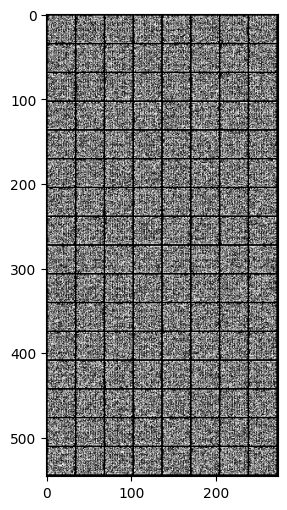

In [18]:
# visualize the output - at first it should just look like random noise!!
x_fake = G(z)
plt.imshow(transforms.ToPILImage()(make_grid(x_fake, nrow=8)))

## 2.2. The discriminator

The discriminator will be a mirror image of the generator.

The discriminator will also use a fully convolutional architecutre, with each block consisting of:
- Conv layer
- BatchNorm
- ReLU

Complete the function `get_downscaling_block` and then use it to define the following architecture for the discriminator:

Input: Image shaped `[n_batch, 1, 32, 32]` (in [-1, 1])
Output: Discriminator scores `[n_batch, 1]` in range [0, 1]

1. First downscaling block $\rightarrow$ `[n_batch, ndf, 16, 16]`
2. Second downscaling block $\rightarrow$ `[n_batch, ndf*2, 8, 8]`
3. Third downscaling block $\rightarrow$ `[n_batch, ndf*4, 4, 4]`
4. Last downscaling block $\rightarrow$ `[n_batch, 1]`

In [19]:
def get_downscaling_block(channels_in, channels_out, kernel, stride, padding, use_batch_norm=True, is_last=False):
    """
    Creates a block for the discriminator that downscales the input.

    Args:
    - channels_in (int): Number of input channels.
    - channels_out (int): Number of output channels.
    - kernel (int): Kernel size for the convolution.
    - stride (int): Stride for the convolution.
    - padding (int): Padding for the convolution.
    - use_batch_norm (bool): Whether to use batch normalization.
    - is_last (bool): If True, uses Sigmoid activation for the output layer.

    Returns:
    - nn.Sequential: A sequential container of layers (downscaling block).
    """
    if is_last:
        # Last block: Conv2d followed by a Sigmoid activation
        return nn.Sequential(
            nn.Conv2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding, bias=False),
            nn.Sigmoid()
        )
    elif not use_batch_norm:
        # Blocks without batch normalization
        return nn.Sequential(
            nn.Conv2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding, bias=False),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )
    else:
        # Blocks with batch normalization
        return nn.Sequential(
            nn.Conv2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding, bias=False),
            nn.BatchNorm2d(channels_out),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

class Discriminator(nn.Module):
    def __init__(self, ndf, nchannels=1):
        """
        Initializes the Discriminator network.

        Args:
        - ndf (int): Size of feature maps in the discriminator.
        - nchannels (int): Number of channels in the input images (default is 1 for grayscale).
        """
        super().__init__()

        # Define the discriminator model
        self.model = nn.Sequential(
            get_downscaling_block(nchannels, ndf, 4, 2, 1),  # Downscale input image
            get_downscaling_block(ndf, ndf * 2, 4, 2, 1),  # Further downscale
            get_downscaling_block(ndf * 2, ndf * 4, 4, 2, 1),  # Continue downscaling
            get_downscaling_block(ndf * 4, 1, 4, 1, 0, is_last=True)  # Final layer to output classification
        )

    def forward(self, x):
        """
        Forward pass of the discriminator.

        Args:
        - x (Tensor): Input image.

        Returns:
        - Tensor: Discriminator score for the input image.
        """
        # Pass the input through the model and flatten the output
        return self.model(x).squeeze(1).squeeze(1)

### 2.2.3 Sanity Checking

In [20]:
real_batch, real_labels = next(iter(dataloader))

In [21]:
D = Discriminator(ndf=32, nchannels=1)
assert D(real_batch).shape == (real_batch.shape[0], 1)

# 3. Training

## 3.1 Loss
The essential thing to remember is that the logistic and the non-saturating logistic GAN losses can be written exclusively using the [binary cross entropy loss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html). Our GAN loss will be defined ONLY using the following criterion:



In [22]:
criterion = nn.BCELoss() # we will build off of this to make our final GAN loss!

## 3.2 Helper functions

We will need a few helper functions.
1. First, we need to continuously sample z from a Gaussian distribution.
2. Secondly, we need to make our "ground-truth" labels when using the BCE loss. This should output vectors of either 0s or 1s.

In [23]:
def sample_z(batch_size, nz):
    return torch.randn(batch_size, nz, device=device)

# this is for the real ground-truth label
def get_labels_one(batch_size):
    r = torch.ones(batch_size)
    return r.to(device)

# this is for the generated ground-truth label
def get_labels_zero(batch_size):
    r = torch.zeros(batch_size)
    return r.to(device)


# To initialize the weights of a GAN, the DCGAN paper found that best results are obtained
# with Gaussian initialization with mean=0; std=0.02
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# for visualization
to_pil = transforms.ToPILImage()
renorm = transforms.Normalize((-1.), (2.))

## 3.3 Creating the optimizers and hyperparameters

The original DCGAN paper shows that Adam works well in the generator and the discriminator with a learning rate of 0.0002 and Beta1 = 0.5.

Define your optimizers

In [24]:
# Hyperparameters
nz = 100        # Size of z latent vector (i.e., size of generator input)
ngf = 32        # Size of feature maps in generator
ndf = 32        # Size of feature maps in discriminator
nchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

## 3.3 Training!

Now for the fun part, training!
Training a GAN consists in making an update to the discriminator, then the generator.
Training a GAN requires BABYSITTING!! Remember that many things can go wrong when training a GAN:
- The discriminator is too strong for the generator - the generator cannot improve.
- The generator easily fools the discriminator - cannot learn.
- Mode collapse - generator is not capable of generating diverse images.

In [25]:
def train_gan(netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=10, device='cpu'):
    """
    Train a GAN network.

    Args:
        netG (nn.Module): Generator network.
        netD (nn.Module): Discriminator network.
        dataloader (DataLoader): DataLoader for the dataset.
        nz (int): Size of the latent vector.
        criterion (loss function): Loss function for training.
        g_opt (optimizer): Optimizer for the generator.
        d_opt (optimizer): Optimizer for the discriminator.
        nb_epochs (int): Number of training epochs.
        device (str): Device to run the training on.

    Returns:
        tuple: Tuple containing the lists of generator losses, discriminator losses, 
               average generator losses, average discriminator losses, and generated images per epoch.
    """

    avg_g_losses, avg_d_losses, epoch_images, batch_images = [], [], [], []
    z_test = torch.randn(64, nz, device=device)  # Sample noise for testing

    for epoch in tqdm(range(nb_epochs), desc="Train", unit="epoch"):
        g_losses, d_losses = [], []

        for i, (im, _) in enumerate(dataloader):
            im = im.to(device)
            cur_batch_size = im.shape[0]
            z = torch.randn(cur_batch_size, nz, device=device)

            # Discriminator training
            netD.zero_grad()
            real_label = torch.ones(cur_batch_size, device=device)
            fake_label = torch.zeros(cur_batch_size, device=device)

            # Real images
            output = netD(im).squeeze()  # Adjust based on discriminator's output
            d_loss_real = criterion(output, real_label)
            d_loss_real.backward()

            # Fake images
            fake = netG(z)
            output = netD(fake.detach()).squeeze()  # Adjust based on discriminator's output
            d_loss_fake = criterion(output, fake_label)
            d_loss_fake.backward()

            d_loss = d_loss_real + d_loss_fake
            d_opt.step()

            # Generator training
            netG.zero_grad()
            output = netD(fake).view(-1)
            g_loss = criterion(output, real_label)
            g_loss.backward()
            g_opt.step()
            
            # Save metrics
            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())
            
            # Generate and store images at the end of the batch (for animation purposes)
            with torch.no_grad():
                fake_im = netG(z_test)
                grid = make_grid(fake_im, nrow=8, normalize=True)
                pil_img = Image.fromarray(grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy())
                batch_images.append(pil_img)

        # Calculate and store average losses for this epoch
        avg_g_losses.append(torch.mean(torch.FloatTensor(g_losses)))
        avg_d_losses.append(torch.mean(torch.FloatTensor(d_losses)))

        # Generate and store images at the end of the epoch
        with torch.no_grad():
            fake_im = netG(z_test)
            grid = make_grid(fake_im, nrow=8, normalize=True)
            pil_img = Image.fromarray(grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy())
            epoch_images.append(pil_img)

    return avg_g_losses, avg_d_losses, epoch_images, batch_images



def smooth_curve(points, factor=0.9):
    """Apply smoothing to a curve."""
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points


def plot_gan_training(epoch_images, avg_g_losses, avg_d_losses, batch_images, 
                      show_epoch_images=True, show_loss_graph=True, show_animation=True, 
                      path='figures/', save=True, every_nth_epoch=1, smooth_factor=0.9, nrows=2, ncols=5):
    """
    Plot the generated images, average losses, and create an animation from GAN training.

    Args:
        epoch_images (list): List of PIL Images generated at the end of each epoch.
        avg_g_losses (list): List of average generator losses per epoch.
        avg_d_losses (list): List of average discriminator losses per epoch.
        batch_images (list): List of PIL Images generated at the end of each batch.
        show_epoch_images (bool): Whether to plot epoch images.
        show_loss_graph (bool): Whether to plot loss graphs.
        show_animation (bool): Whether to show an animation of batch images.
        path (str): Directory path to save the figures.
        save (bool): Whether to save the figures.
    """

    # Create the directory if it does not exist
    if not os.path.exists(path):
        os.makedirs(path)

    # Current datetime to use in file names
    datetime_suffix = datetime.now().strftime("%Y%m%d_%H%M%S")


    if show_epoch_images:
        
        sampled_epoch_images = epoch_images[::every_nth_epoch]
        plt.figure(figsize=(ncols * 4, nrows * 4))
        for i, img in enumerate(sampled_epoch_images):
            plt.subplot(nrows, ncols, i + 1)
            plt.imshow(img)
            plt.title(f"Epoch {(i + 1) * every_nth_epoch}")
            plt.axis('off')
        plt.suptitle('Generated Images per Epoch')
        if save:
            plt.savefig(f"{path}epoch_images_{datetime_suffix}.pdf", format='pdf')
        plt.show()

    if show_loss_graph:
        plt.figure(figsize=(10, 4))
        smooth_g_losses = smooth_curve(avg_g_losses, smooth_factor)
        smooth_d_losses = smooth_curve(avg_d_losses, smooth_factor)
        plt.plot(smooth_g_losses, label='Average Generator Loss')
        plt.plot(smooth_d_losses, label='Average Discriminator Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Average Loss per Epoch')
        #plt.xticks(range(len(smooth_g_losses)))
        plt.grid()
        plt.legend()
        if save:
            plt.savefig(f"{path}loss_graph_{datetime_suffix}.pdf", format='pdf')
        plt.show()

    if show_animation:
        sampled_images = batch_images[::50]
        fig = plt.figure(figsize=(8,8))
        plt.axis("off")
        ims = [[plt.imshow(i, animated=True)] for i in sampled_images]
        anim = ArtistAnimation(fig, ims, interval=100, repeat_delay=1000, repeat=True, blit=True)
        plt.close(fig)  # Prevents duplicate display
        return HTML(anim.to_jshtml())

# Example usage:
# plot_gan_training(epoch_images, avg_g_losses, avg_d_losses, batch_images)



In [178]:
avg_g_losses, avg_d_losses, epoch_images, batch_images = train_gan(netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=10, device=device)

Train: 100%|██████████| 10/10 [03:21<00:00, 20.11s/epoch]


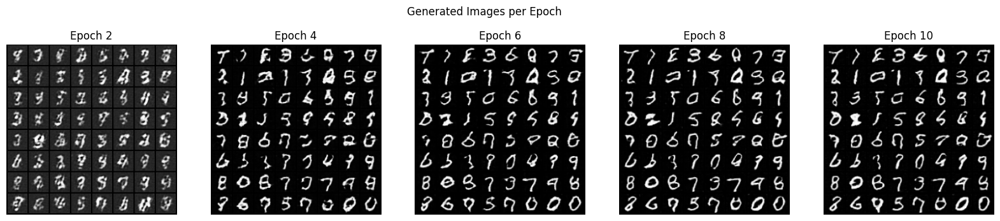

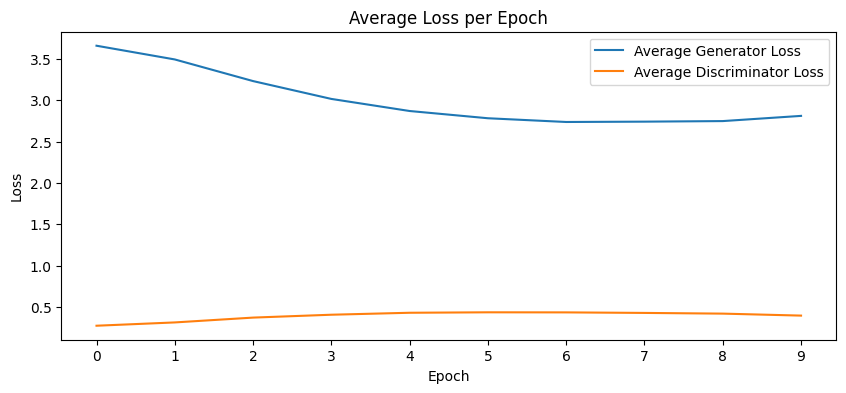

In [179]:
plot_gan_training(epoch_images, avg_g_losses, avg_d_losses, batch_images,
                show_animation=False, every_nth_epoch=2, smooth_factor=0.8, nrows=1, ncols=5, save=True)


## Learning for longer (100 epochs)

In [194]:
# Hyperparameters
nz = 100        # Size of z latent vector (i.e., size of generator input)
ngf = 32        # number of feature maps in generator
ndf = 32        # number of feature maps in discriminator
nchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses, avg_d_losses, epoch_images, batch_images = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=100, device=device)



Train: 100%|██████████| 100/100 [23:03<00:00, 13.83s/epoch]


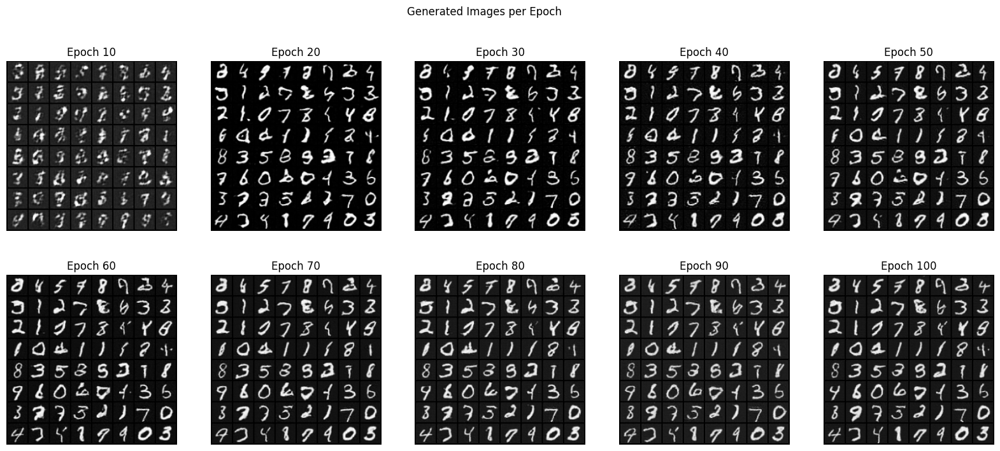

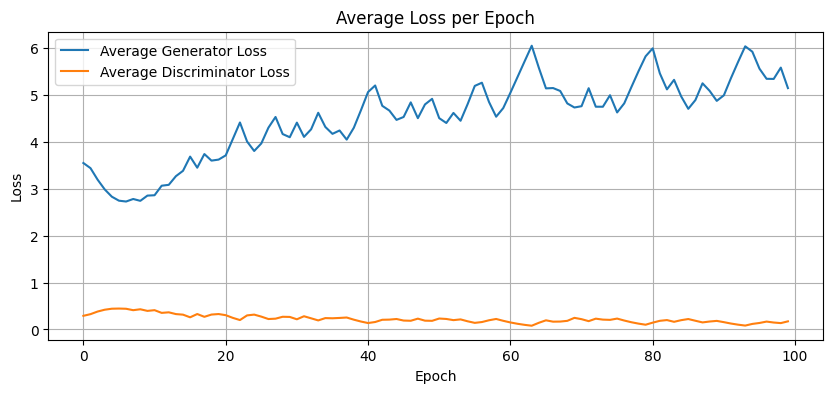

In [197]:
plot_gan_training(epoch_images, avg_g_losses, avg_d_losses, batch_images,
                show_animation=False, every_nth_epoch=10, smooth_factor=0.8, nrows=2, ncols=5, save=True)


# 4. GOING FURTHER: Studying different aspects concering GANs

## 4.1 Increasing/Decreasing ngf or ndf:

* Increasing ngf Significantly: This would mean the generator has more capacity to learn complex features. It can potentially lead to more detailed and diverse generated images. However, if ngf is too large compared to ndf, the generator might overpower the discriminator, making it harder to train the GAN effectively.

* Decreasing ngf Significantly: This reduces the generator's capacity to learn and represent complex features. The generated images might become less detailed and more repetitive. A too-small ngf can lead to underfitting where the generator fails to produce convincing images.

* Increasing ndf Significantly: This gives the discriminator more capacity to distinguish between real and fake images. A stronger discriminator can force the generator to improve its output quality. However, if the discriminator becomes too strong, it might easily reject generator outputs without giving it a chance to learn effectively.

* Decreasing ndf Significantly: This weakens the discriminator, making it less effective at distinguishing real from fake. This can sometimes help the generator to learn better in the early stages, but a too-weak discriminator might not provide enough gradient information for the generator to learn to produce high-quality images.

In [180]:
# Hyperparameters
nz = 100        # Size of z latent vector (i.e., size of generator input)
ngf = 256       ############# INCREASED number of feature maps in generator
ndf = 8         ############# DECREASED number of feature maps in discriminator
nchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses, avg_d_losses, epoch_images, batch_images = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=20, device=device)



Train: 100%|██████████| 20/20 [06:31<00:00, 19.56s/epoch]


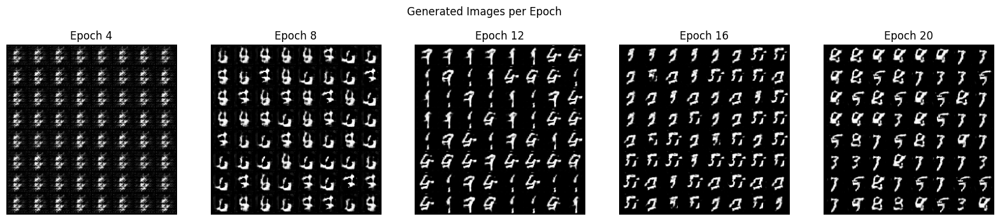

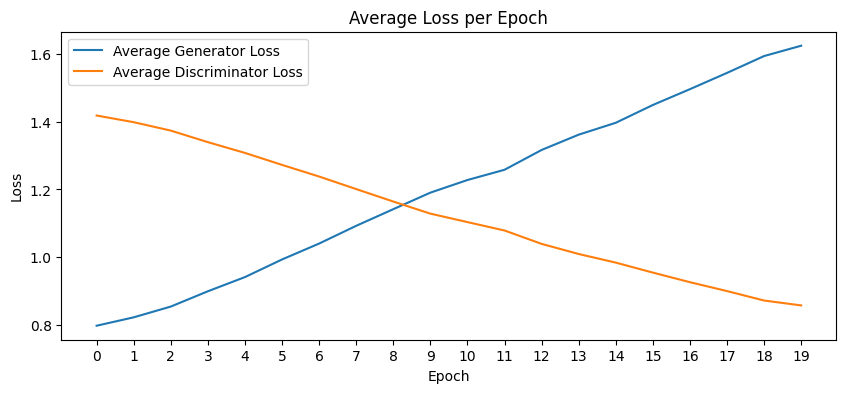

In [181]:
plot_gan_training(epoch_images, avg_g_losses, avg_d_losses, batch_images,
                  show_epoch_images=True, show_animation=False, every_nth_epoch=4, smooth_factor=0.9, nrows=1, ncols=5, save=True)


In [182]:
# Hyperparameters
nz = 100        # Size of z latent vector (i.e., size of generator input)
ngf = 8         ############# DECREASED Size of feature maps in generator
ndf = 256       ############# INCREASED Size of feature maps in discriminator
nchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers


# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses, avg_d_losses, epoch_images, batch_images = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=20, device=device)



Train: 100%|██████████| 20/20 [08:21<00:00, 25.08s/epoch]


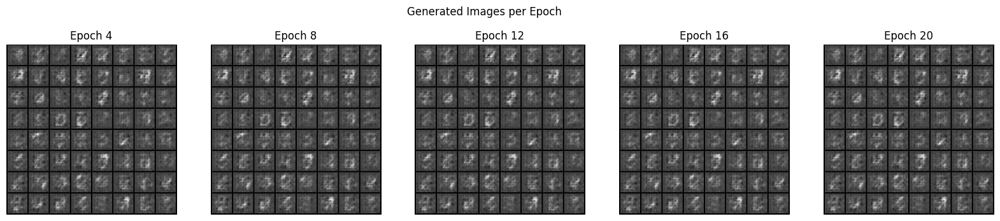

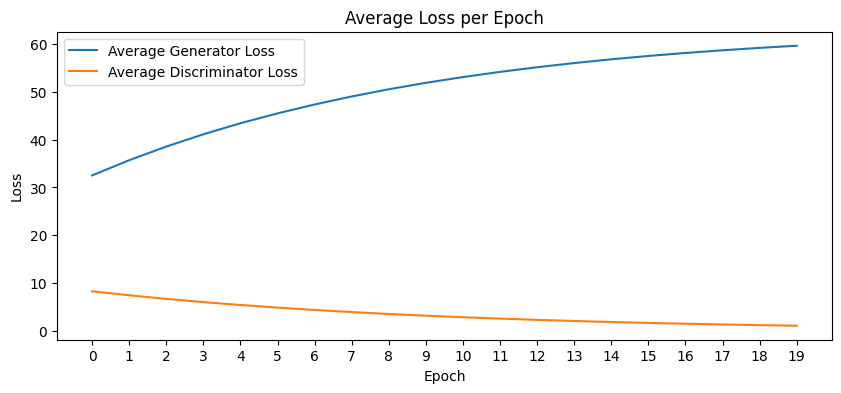

In [183]:
plot_gan_training(epoch_images, avg_g_losses, avg_d_losses, batch_images,
                  show_epoch_images=True, show_animation=False, every_nth_epoch=4, nrows=1, ncols=5, save=True)


## 4.2 Changing weight initialization to default

In [184]:
# Hyperparameters
nz = 100        # Size of z latent vector (i.e., size of generator input)
ngf = 32        # Size of feature maps in generator
ndf = 32        # Size of feature maps in discriminator
nchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

#################### We don't apply weight init here (default weights)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses_default, avg_d_losses_default, epoch_images_default, batch_images_default = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=20, device=device)

Train: 100%|██████████| 20/20 [03:02<00:00,  9.15s/epoch]


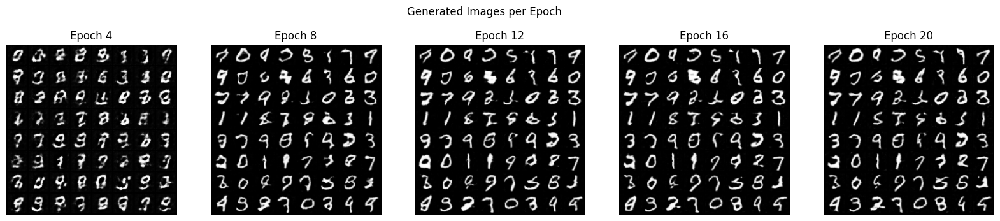

In [186]:
plot_gan_training(epoch_images_default, None, None, None, show_loss_graph=False,
                  show_epoch_images=True, show_animation=False, every_nth_epoch=4,
                  nrows=1, ncols=5, save=True)


In [185]:
# Hyperparameters
nz = 100        # Size of z latent vector (i.e., size of generator input)
ngf = 32        # Size of feature maps in generator
ndf = 32        # Size of feature maps in discriminator
nchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

#################### We apply weight init here
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses, avg_d_losses, epoch_images, batch_images = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=20, device=device)

Train: 100%|██████████| 20/20 [03:09<00:00,  9.47s/epoch]


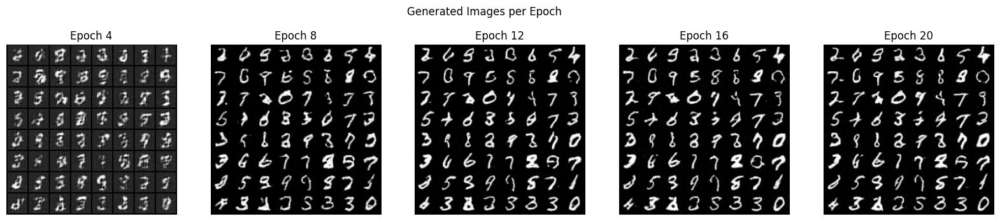

In [187]:
plot_gan_training(epoch_images, None, None, None, show_loss_graph=False,
                  show_epoch_images=True, show_animation=False, every_nth_epoch=4,
                  nrows=1, ncols=5, save=True)


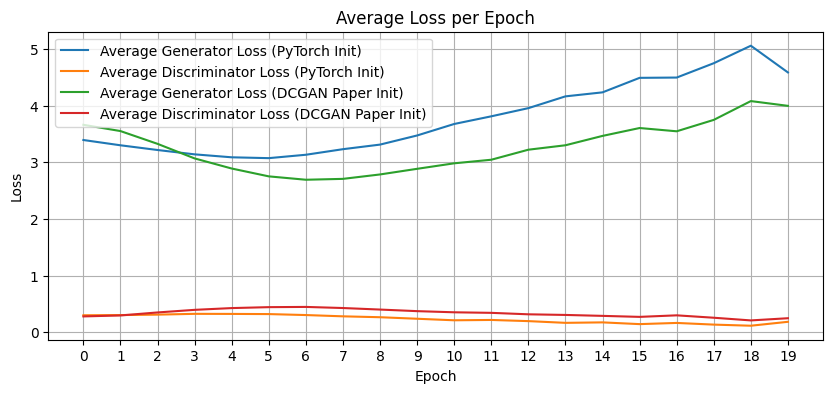

In [188]:
plt.figure(figsize=(10, 4))
smooth_factor = 0.8
path = 'figures/'

smooth_g_losses_default = smooth_curve(avg_g_losses_default, smooth_factor)
smooth_d_losses_default = smooth_curve(avg_d_losses_default, smooth_factor)

smooth_g_losses = smooth_curve(avg_g_losses, smooth_factor)
smooth_d_losses = smooth_curve(avg_d_losses, smooth_factor)

plt.plot(smooth_g_losses_default, label='Average Generator Loss (PyTorch Init)')
plt.plot(smooth_d_losses_default, label='Average Discriminator Loss (PyTorch Init)')

plt.plot(smooth_g_losses, label='Average Generator Loss (DCGAN Paper Init)')
plt.plot(smooth_d_losses, label='Average Discriminator Loss (DCGAN Paper Init)')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Average Loss per Epoch')
plt.xticks(range(len(smooth_g_losses)))
plt.legend()
plt.grid()
plt.savefig(f"{path}loss_graph_weight_init.pdf", format='pdf')
plt.show()

## 4.3 Reducing/Increasing nz significantly

In [210]:
# Hyperparameters
nz  = 1000      ########### INCREASED Size of z latent vector (i.e., size of generator input)
ngf = 32        # Size of feature maps in generator
ndf = 32        # Size of feature maps in discriminatornchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses_1000, avg_d_losses_1000, epoch_images_1000, _ = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=10, device=device)



Train: 100%|██████████| 10/10 [01:41<00:00, 10.19s/epoch]


In [212]:
# Hyperparameters
nz  = 10        ###########  DECREASED Size of z latent vector (i.e., size of generator input)
ngf = 32        # Size of feature maps in generator
ndf = 32        # Size of feature maps in discriminatornchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses_10, avg_d_losses_10, epoch_images_10, _ = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=10, device=device)

Train: 100%|██████████| 10/10 [01:49<00:00, 10.95s/epoch]


In [211]:
# Hyperparameters
nz  = 2         ########### EXTREMELY DECREASED Size of z latent vector (i.e., size of generator input)
ngf = 32        # Size of feature maps in generator
ndf = 32        # Size of feature maps in discriminatornchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses_2, avg_d_losses_2, epoch_images_2, _ = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=10, device=device)

Train: 100%|██████████| 10/10 [01:45<00:00, 10.59s/epoch]


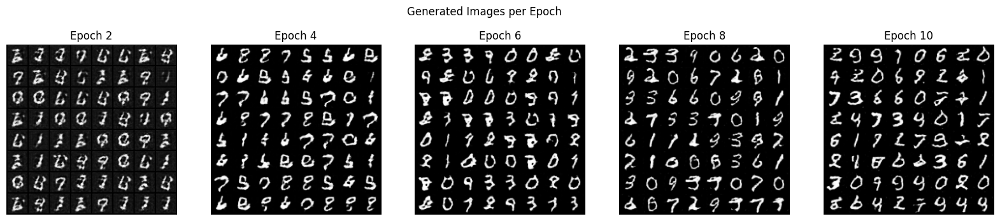

In [216]:
plot_gan_training(epoch_images_2, None, None, None, show_loss_graph=False,
                  show_animation=False, every_nth_epoch=2,
                  nrows=1, ncols=5, save=True)


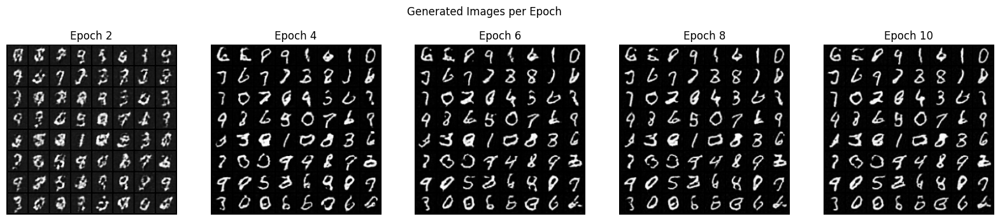

In [217]:
plot_gan_training(epoch_images_10, None, None, None, show_loss_graph=False,
                  show_animation=False, every_nth_epoch=2,
                  nrows=1, ncols=5, save=True)

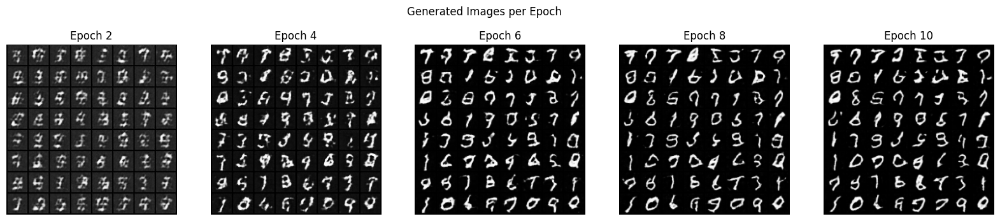

In [218]:
plot_gan_training(epoch_images_1000, None, None, None, show_loss_graph=False,
                  show_animation=False, every_nth_epoch=2,
                  nrows=1, ncols=5, save=True)

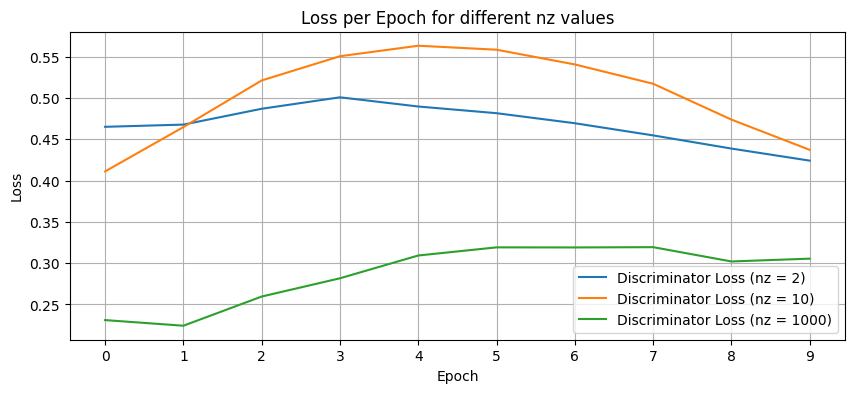

In [222]:
plt.figure(figsize=(10, 4))
smooth_factor = 0.8
path = 'figures/'

smooth_g_losses_1000 = smooth_curve(avg_g_losses_1000, smooth_factor)
smooth_d_losses_1000 = smooth_curve(avg_d_losses_1000, smooth_factor)

smooth_g_losses_10 = smooth_curve(avg_g_losses_10, smooth_factor)
smooth_d_losses_10 = smooth_curve(avg_d_losses_10, smooth_factor)

smooth_g_losses_2 = smooth_curve(avg_g_losses_2, smooth_factor)
smooth_d_losses_2 = smooth_curve(avg_d_losses_2, smooth_factor)

# plt.plot(smooth_g_losses_2, label='Generator Loss (nz = 2)')
# plt.plot(smooth_g_losses_10, label='Generator Loss (nz = 10)')
# plt.plot(smooth_g_losses_1000, label='Generator Loss (nz = 1000)')

plt.plot(smooth_d_losses_2, label='Discriminator Loss (nz = 2)')
plt.plot(smooth_d_losses_10, label='Discriminator Loss (nz = 10)')
plt.plot(smooth_d_losses_1000, label='Discriminator Loss (nz = 1000)')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss per Epoch for different nz values')
plt.xticks(range(len(smooth_g_losses_1000)))
plt.legend()
plt.grid()
plt.savefig(f"{path}loss_graph_nz_discriminator.pdf", format='pdf')
plt.show()

## 4.4. Replacing the training loss with the original one
The generator will not be able to learn because at the beginning, D(G(z)) is 0.

In [189]:
def train_gan_original_loss(netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=10, device='cpu'):
    avg_g_losses, avg_d_losses, epoch_images, batch_images = [], [], [], []
    z_test = torch.randn(64, nz, device=device)  # Sample noise for testing

    for epoch in tqdm(range(nb_epochs), desc="Train", unit="epoch"):
        g_losses, d_losses = [], []

        for i, (im, _) in enumerate(dataloader):
            im = im.to(device)
            cur_batch_size = im.shape[0]
            z = torch.randn(cur_batch_size, nz, device=device)

            # Discriminator training
            netD.zero_grad()
            real_label = torch.ones(cur_batch_size, device=device)
            fake_label = torch.zeros(cur_batch_size, device=device)

            # Real images
            output = netD(im).view(-1)
            d_loss_real = criterion(output, real_label)

            # Fake images
            fake = netG(z)
            output = netD(fake.detach()).view(-1)
            d_loss_fake = criterion(output, fake_label)

            # Total loss
            d_loss = d_loss_real + d_loss_fake
            d_loss.backward()
            d_opt.step()

            # Generator training
            netG.zero_grad()
            output = netD(fake).view(-1)
            g_loss = -torch.log(1 - output).mean()  # Original GAN loss
            g_loss.backward()
            g_opt.step()

            # Save metrics
            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())

            # Generate and store images for animation
            with torch.no_grad():
                fake_im = netG(z_test)
                grid = make_grid(fake_im, nrow=8, normalize=True)
                pil_img = Image.fromarray(grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy())
                batch_images.append(pil_img)

        # Calculate and store average losses for this epoch
        avg_g_losses.append(torch.mean(torch.FloatTensor(g_losses)))
        avg_d_losses.append(torch.mean(torch.FloatTensor(d_losses)))

        # Generate and store images at the end of the epoch
        with torch.no_grad():
            fake_im = netG(z_test)
            grid = make_grid(fake_im, nrow=8, normalize=True)
            pil_img = Image.fromarray(grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy())
            epoch_images.append(pil_img)

    return avg_g_losses, avg_d_losses, epoch_images, batch_images


In [ ]:
# Hyperparameters
nz = 100        # Size of z latent vector (i.e., size of generator input)
ngf = 32        # Size of feature maps in generator
ndf = 32        # Size of feature maps in discriminator
nchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses, avg_d_losses, epoch_images, batch_images = train_gan_original_loss(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=10, device=device)



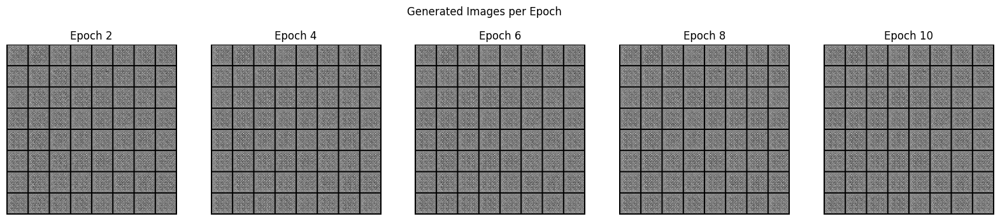

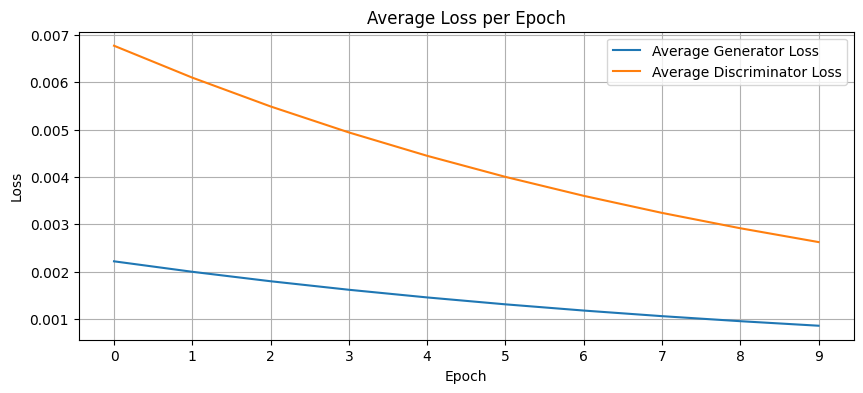

In [193]:
plot_gan_training(epoch_images, avg_g_losses, avg_d_losses, batch_images,
                  show_animation=False, every_nth_epoch=2, 
                  smooth_factor=0.9, nrows=1, ncols=5, save=True)


## 4.5 Changing the learning rate on both models

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

lr_rates = [0.0002, 0.0005, 0.001, 0.003, 0.01] 

all_g_losses = {} 
all_d_losses = {} 
first_epoch_images = {} 


# Hyperparameters
nz = 100        # Size of z latent vector (i.e., size of generator input)
ngf = 64        # Size of feature maps in generator
ndf = 64        # Size of feature maps in discriminator
nchannels = 1   # Number of channels in the training images
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers

for lr in lr_rates:
    # Initialize networks
    netD = Discriminator(ndf, nchannels).to(device)
    netG = Generator(nz, ngf).to(device)

    # Apply weight initialization
    netD.apply(weights_init)
    netG.apply(weights_init)

    # Optimizers
    g_opt = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
    d_opt = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))

    avg_g_losses, avg_d_losses, epoch_images, _ = train_gan(
        netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=10, device=device)
    
    # Store the results for this learning rate
    all_g_losses[lr] = avg_g_losses
    all_d_losses[lr] = avg_d_losses
    first_epoch_images[lr] = epoch_images
    


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

nb_epochs=10

# Plotting Losses
plt.figure(figsize=(15, 5))

# Generator Loss per Epoch for each Learning Rate
plt.subplot(1, 2, 1)
for lr, losses in all_g_losses.items():
    plt.plot(losses, label=f'LR: {lr}')
plt.title('Generator Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Discriminator Loss per Epoch for each Learning Rate
plt.subplot(1, 2, 2)
for lr, losses in all_d_losses.items():
    plt.plot(losses, label=f'LR: {lr}')
plt.title('Discriminator Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.tight_layout()
plt.show()


In [ ]:
n_epochs_to_store = 10  # Number of epochs to display
n_lr = len(lr_rates)   # Number of learning rates

# Create a grid for plotting with extra row for learning rate labels
fig = plt.figure(figsize=(n_epochs_to_store * 3, n_lr * 3 + 1))  # Extra space for labels
outer_gs = gridspec.GridSpec(n_lr, 1, figure=fig, hspace=0.4)  # Adjust hspace as needed

for i, lr in enumerate(lr_rates):
    # Create an inner grid for each learning rate
    inner_gs = gridspec.GridSpecFromSubplotSpec(1, n_epochs_to_store, subplot_spec=outer_gs[i])
    for j in range(n_epochs_to_store):
        ax = plt.subplot(inner_gs[j])
        img = first_epoch_images[lr][j]
        ax.imshow(img)
        ax.axis('off')
        if i == 0:
            ax.set_title(f'Epoch {j + 1}')
    # Add learning rate label below each row
    lr_label_ax = fig.add_subplot(outer_gs[i])
    lr_label_ax.text(0.5, 1.2, f'LR = {lr}', ha='center', va='center', fontsize=20)
    lr_label_ax.axis('off')  # Hide this axis

plt.show()

## 4.6 Linear interpolations

In [223]:
def train_gan_v2(netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=10, device='cuda'):
    """
    Train a GAN network.

    Args:
        netG (nn.Module): Generator network.
        netD (nn.Module): Discriminator network.
        dataloader (DataLoader): DataLoader for the dataset.
        nz (int): Size of the latent vector.
        criterion (loss function): Loss function for training.
        g_opt (optimizer): Optimizer for the generator.
        d_opt (optimizer): Optimizer for the discriminator.
        nb_epochs (int): Number of training epochs.
        device (str): Device to run the training on.

    Returns:
        tuple: trained generator and discriminator
    """

    for epoch in tqdm(range(nb_epochs), desc="Train", unit="epoch"):
        for i, (im, _) in enumerate(dataloader):
            im = im.to(device)
            cur_batch_size = im.shape[0]
            z = torch.randn(cur_batch_size, nz, device=device)

            # Discriminator training
            netD.zero_grad()
            real_label = torch.ones(cur_batch_size, device=device)
            fake_label = torch.zeros(cur_batch_size, device=device)

            # Real images
            output = netD(im).view(-1)
            d_loss_real = criterion(output, real_label)
            d_loss_real.backward()

            # Fake images
            fake = netG(z)
            output = netD(fake.detach()).view(-1)
            d_loss_fake = criterion(output, fake_label)
            d_loss_fake.backward()

            d_loss = d_loss_real + d_loss_fake
            d_opt.step()

            # Generator training
            netG.zero_grad()
            output = netD(fake).view(-1)
            g_loss = criterion(output, real_label)
            g_loss.backward()
            g_opt.step()
            
    return netG, netD


def interpolate_vectors(z1, z2, alpha):
    """Interpolate between two vectors."""
    return alpha * z1 + (1 - alpha) * z2

In [261]:
# Hyperparameters
nz = 100        # Size of z latent vector (i.e., size of generator input)
ngf = 64        #  Size of feature maps in generator
ndf = 64        # Size of feature maps in discriminator
nchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers


# Initialize networks
netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)


# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

trained_netG, trained_netD = train_gan_v2(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=20, device=device)


Train:   0%|          | 0/20 [00:00<?, ?epoch/s]

Train: 100%|██████████| 20/20 [02:56<00:00,  8.82s/epoch]


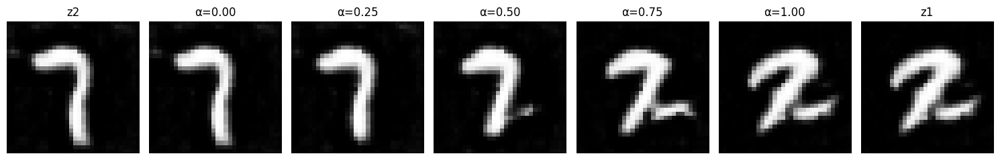

In [311]:
# Generate two noise vectors z1 and z2
z1 = torch.randn(1, nz, device=device)
z2 = torch.randn(1, nz, device=device)

# Number of interpolation steps
n_interpolations = 5
alphas = np.linspace(0, 1, n_interpolations)

# Plotting
fig, axes = plt.subplots(nrows=1, ncols=n_interpolations + 2, figsize=(15, 3))

# Generate and plot images for z1 and z2
with torch.no_grad():
    img_z1 = netG(z1).detach().cpu().numpy().squeeze()
    img_z2 = netG(z2).detach().cpu().numpy().squeeze()

axes[-1].imshow(img_z1, cmap='gray')
axes[-1].set_title('z1')
axes[-1].axis('off')

axes[0].imshow(img_z2, cmap='gray')
axes[0].set_title('z2')
axes[0].axis('off')

# Generate and plot interpolated images
for i, alpha in enumerate(alphas):
    z_interp = interpolate_vectors(z1, z2, alpha)
    img_interp = netG(z_interp).detach().cpu().numpy().squeeze()

    axes[i+1].imshow(img_interp, cmap='gray')
    axes[i+1].set_title(f'α={alpha:.2f}')
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()

## 4.7 Trying other datasets

### CelebA

In [372]:
# Resize to 32x32 for easier upsampling/downsampling
mytransform = transforms.Compose([transforms.Resize(32),
                                  transforms.CenterCrop(32),
                                  transforms.ToTensor(),
                                 transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))]) # normalize between [-1, 1] with tanh activation

celeba_train = torchvision.datasets.CelebA(root='.', download=True, transform=mytransform)

Files already downloaded and verified


In [373]:
dataloader = DataLoader(dataset=celeba_train, shuffle=True, batch_size=128, num_workers=4)

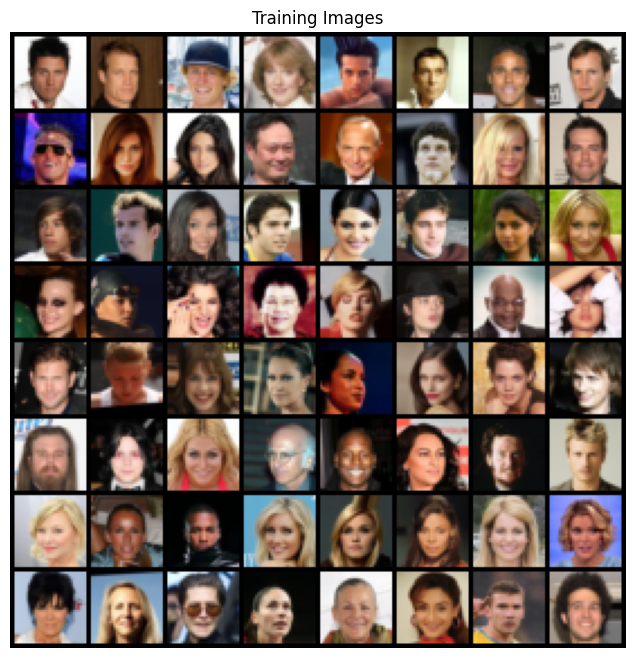

In [374]:
import torchvision.utils as vutils

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
real = np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0))
plt.imshow(real)

In [375]:
# Hyperparameters
nz  = 100       # INCREASED Size of z latent vector (i.e., size of generator input)
ngf = 32        # Size of feature maps in generator
ndf = 32        # Size of feature maps in discriminatornchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers
nchannels = 3   # RGB images

# Initialize networks
netD = Discriminator(ndf, nchannels=nchannels).to(device)
netG = Generator(nz, ngf, nchannels=nchannels).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses_celeb, avg_d_losses_celeb, epoch_images_celeb, batch_images_celeb = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=50, device=device)

Train:   0%|          | 0/50 [00:00<?, ?epoch/s]

Train: 100%|██████████| 50/50 [29:12<00:00, 35.05s/epoch]


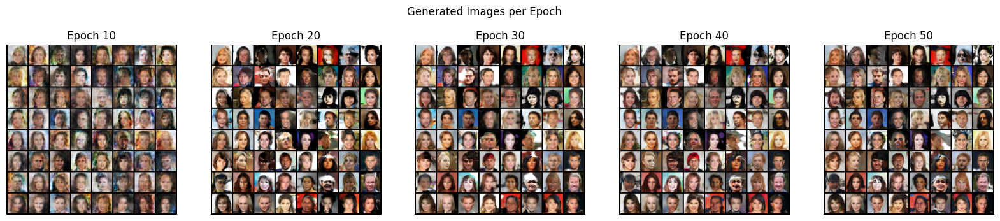

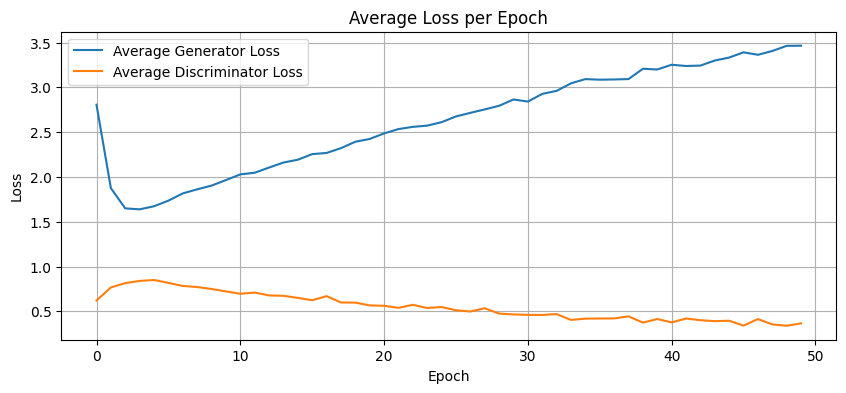

In [381]:
plot_gan_training(epoch_images_celeb, avg_g_losses_celeb, avg_d_losses_celeb, None,
                  show_animation=False, every_nth_epoch=10, smooth_factor=0.1,
                  nrows=1, ncols=5, save=True)

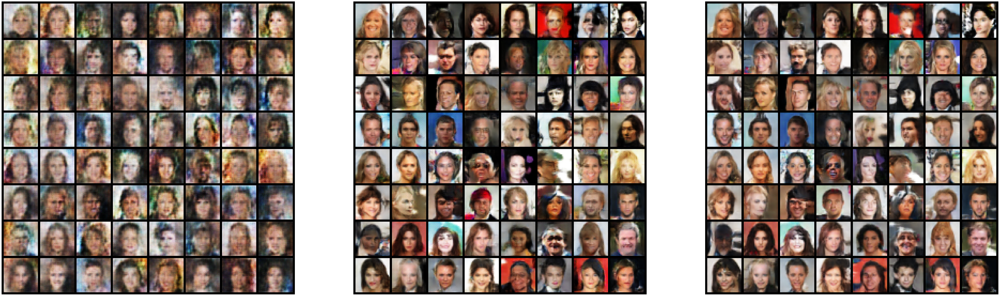

In [382]:
plt.figure(figsize=(20 * 4, 20 * 4))


plt.subplot(1, 3, 1)
plt.imshow(epoch_images_celeb[0])
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(epoch_images_celeb[24])
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(epoch_images_celeb[49])
plt.axis('off')

plt.show()

### CIFAR-10

In [362]:
# Resize to 32x32 for easier upsampling/downsampling
mytransform = transforms.Compose([transforms.Resize(32),
                                  transforms.CenterCrop(32),
                                  transforms.ToTensor(),
                                 transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))]) # normalize between [-1, 1] with tanh activation

cifar10_train = torchvision.datasets.CIFAR10(root='.', download=True, transform=mytransform)

100%|██████████| 170498071/170498071 [00:16<00:00, 10535889.84it/s]


Extracting .\cifar-10-python.tar.gz to .


In [363]:
dataloader = DataLoader(dataset=cifar10_train, shuffle=True, batch_size=128, num_workers=4)

In [366]:
# Hyperparameters
nz  = 100       # INCREASED Size of z latent vector (i.e., size of generator input)
ngf = 32        # Size of feature maps in generator
ndf = 32        # Size of feature maps in discriminatornchannels = 1   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0002   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers
nchannels = 3   # RGB images

# Initialize networks
netD = Discriminator(ndf, nchannels=nchannels).to(device)
netG = Generator(nz, ngf, nchannels=nchannels).to(device)

# Apply weight initialization
netD.apply(weights_init)
netG.apply(weights_init)

# Optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

avg_g_losses_celeb, avg_d_losses_celeb, epoch_images_celeb, batch_images_celeb = train_gan(
    netG, netD, dataloader, nz, criterion, g_opt, d_opt, nb_epochs=50, device=device)

Train:   0%|          | 0/50 [00:00<?, ?epoch/s]

Train: 100%|██████████| 50/50 [13:04<00:00, 15.69s/epoch]


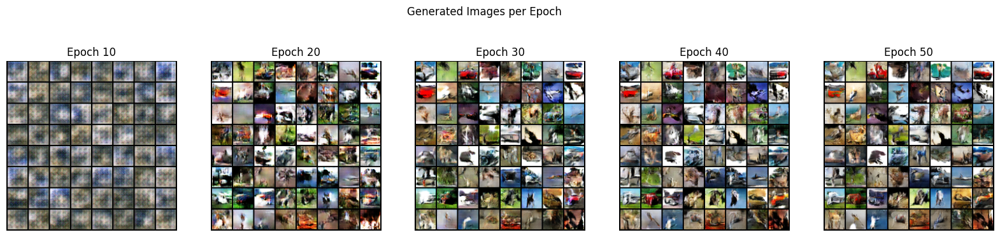

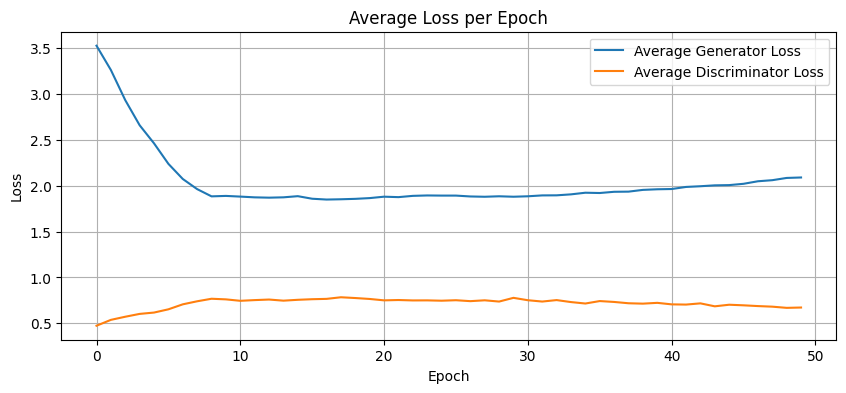

In [371]:
plot_gan_training(epoch_images_celeb, avg_g_losses_celeb, avg_d_losses_celeb, None,
                  show_animation=False, every_nth_epoch=10, smooth_factor=0.6,
                  nrows=2, ncols=5, save=True)

# 5. Conditional GANs [BONUS]

A simple way to improve training performance and obtain control of the generation is to provide extra information into the Generator and the Discriminator, known as **Conditional GANs**. In this case, we will provide the class label (digit number of MNIST) into both the generator and the discriminator. This will help both of the networks.

## 4.1 Conditional Generator and Discriminator

Complete the ConditionalDiscriminator and ConditionalGenerator classes using your GAN building blocks (`get_upsampling_block` and `get_downsampling_block` functions).


In [26]:
batch_size = 128 # Images per batch

# Resize to 32x32 for easier upsampling/downsampling
mytransform = transforms.Compose([transforms.Resize(32),
                                  transforms.ToTensor(),
                                 transforms.Normalize((.5), (.5))]) # normalize between [-1, 1] with tanh activation

mnist_train = torchvision.datasets.MNIST(root='.', download=True, transform=mytransform)


dataloader = DataLoader(dataset=mnist_train,
                         batch_size=batch_size,
                         shuffle=True)

# plot some images
real_batch, real_labels = next(iter(dataloader))

### 4.1.1 Generator

In [112]:
# GENERATOR

'''
The conditional generator needs the label information as well as the latent vector. We will combine the latent vector and the class information in the following way:

- The class information for the generator will be represented as a one-hot vector sized `[batch_size, 10]` (since there are 10 classes in MNIST)
- The latent vector for the generator will still be sized `[batch_size, nz]`

1. Transform both of these modalities into 'images' (by adding dimensions)
2. Like before, apply the first upscaling block to both of these 'images'. We will now have 2 separate blocks sized

'''

class ConditionalGenerator(nn.Module):
    def __init__(self, nz, nc, ngf, nchannels=1):
        """
        Initializes the Conditional Generator network.

        Args:
        - nz (int): Size of the latent vector z.
        - nc (int): Number of classes (size of one-hot vector).
        - ngf (int): Size of feature maps in the generator.
        - nchannels (int): Number of channels in the output images (default is 1 for grayscale).
        """
        super().__init__()
        self.ngf = ngf  # Feature map size for generator


        # Upscaling blocks for latent vector and class vector
        self.upscaling_z = get_upscaling_block(nz, ngf * 8, 4, 1, 0)
        self.upscaling_c = get_upscaling_block(nc, ngf * 8, 4, 1, 0)

        # Rest of the model: combines the upscaled latent vector and class vector
        self.rest_model = nn.Sequential(
            get_upscaling_block(self.ngf * 16, self.ngf * 4, 4, 2, 1), 
            get_upscaling_block(self.ngf * 4, self.ngf * 2, 4, 2, 1),
            get_upscaling_block(self.ngf * 2, nchannels, 4, 2, 1, last_layer=True)
        )

    def forward(self, z, y):
        """
        Forward pass of the conditional generator.

        Args:
        - z (Tensor): Latent vector.
        - y (Tensor): One-hot encoded class vector.

        Returns:
        - Tensor: Generated image conditioned on class vector.
        """
        
        z = z.view(z.size(0), z.size(1), 1, 1)  
        y = y.view(y.size(0), y.size(1), 1, 1)

        # Apply initial upscaling blocks to both z and y
        z = self.upscaling_z(z)
        y = self.upscaling_c(y)
        

        # Concatenate along the channel dimension
        combined = torch.cat([z, y], 1)

        # Pass the combined tensor through the rest of the model
        return self.rest_model(combined)


In this implementation:

- `upscaling_z` and `upscaling_c` are separate upscaling blocks for the latent vector (`z`) and the class vector (`y`), respectively.
- After transforming `z` and `y` into 4D tensors (1x1 feature maps), they are passed through their respective upscaling blocks.
- The output feature maps from `upscaling_z` and `upscaling_c` are concatenated along the channel dimension, effectively combining the latent vector information and class information.
- The concatenated tensor is then passed through the rest of the model (`rest_model`), which contains additional upscaling blocks to generate the final image.

The conditional generator is designed to incorporate class information into the image generation process, allowing the generation of images conditioned on specific classes.

### 4.1.2 Discriminator

In [113]:
# Discriminator

'''
The conditional discriminator needs the label information as well as the latent vector. We will combine the latent vector and the class information in the following way:

- The class information for the discriminator will be represented as a one-hot vector sized `[batch_size, 10]` (since there are 10 classes in MNIST)
- The latent vector for the generator will still be sized `[batch_size, nz]`

1. Transform both of these modalities into 'images' (by adding dimensions)
2. Like before, apply the first upscaling block to both of these 'images'. We will now have 2 separate blocks sized

'''

class ConditionalDiscriminator(nn.Module):
    def __init__(self, ndf, nc, nchannels=1):
        """
        Initializes the Conditional Discriminator.

        Args:
        - ndf (int): Size of feature maps in the discriminator.
        - nc (int): Number of classes (size of one-hot vector for MNIST).
        - nchannels (int): Number of channels in the input images (e.g., 1 for grayscale).

        The discriminator takes both an image and a class label as input.
        The class label is represented as a one-hot encoded vector.
        """
        super().__init__()
        
        # Downscaling block for the input image
        self.downscale_x = get_downscaling_block(nchannels, ndf * 2, 4, 2, 1, use_batch_norm=False)

        # Downscaling block for the one-hot encoded class label
        self.downscale_y = get_downscaling_block(nc, ndf * 2, 4, 2, 1, use_batch_norm=False)

        # Further processing blocks after concatenating image and class feature maps
        self.rest = nn.Sequential(
            get_downscaling_block(ndf * 4, ndf * 4, 4, 2, 1),  # Process combined features
            get_downscaling_block(ndf * 4, ndf * 8, 4, 2, 1),  # Further downscale
            get_downscaling_block(ndf * 8, 1, 4, 1, 0, is_last=True)  # Final layer for discrimination
        )

    def forward(self, x, y):
        """
        Forward pass of the discriminator with both image and class label inputs.

        Args:
        - x (Tensor): Input image.
        - y (Tensor): One-hot encoded class label.

        Returns:
        - Tensor: Discriminator's assessment of the input image being real or fake.
        """
        # Downscale the input image
        x = self.downscale_x(x)

        # Expand and downscale the class label to match the image feature map dimensions
        y = y.view(y.size(0), -1, 1, 1).repeat(1, 1, 16, 16)
        y = self.downscale_y(y)

        # Ensure the dimensions match before concatenation
        y = F.interpolate(y, size=x.shape[2:])

        # Concatenate the processed image and class vector
        combined = torch.cat([x, y], 1)

        # Pass the combined tensor through the rest of the discriminator
        return self.rest(combined).squeeze(1).squeeze(1)



### 4.1.3 Sanity Checks

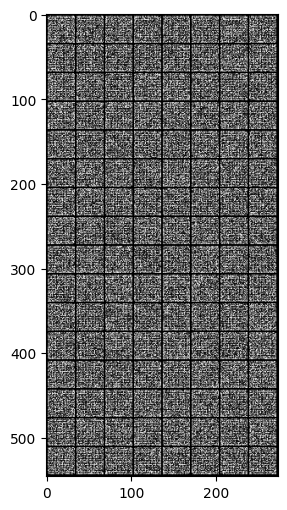

In [29]:
# CONDITIONAL GENERATOR SANITY CHECKING

z = torch.randn(batch_size, nz)
y = F.one_hot(real_labels).float()

cG = ConditionalGenerator(nz=nz, ngf=16, nc=10)
x_fake = cG(z, y)
plt.imshow(transforms.ToPILImage()(make_grid(x_fake, nrow=8)))

In [30]:
# Conditional Discriminator Sanity Checking

cD = ConditionalDiscriminator(ndf=32, nc=10, nchannels=1)
assert cD(real_batch, F.one_hot(real_labels).float()).shape == (real_batch.shape[0], 1)

## 4.2 Training

In [31]:
# Define the training parameters
nz = 100       # Size of z latent vector
nc = 10        # Number of classes in the dataset (e.g., MNIST has 10 digits)
ngf = 32       # Size of feature maps in generator
ndf = 32       # Size of feature maps in discriminator
nchannels = 1  # Number of channels in the training images
lr_d = 0.0002  # Learning rate for discriminator
lr_g = 0.0005  # Learning rate for generator
beta1 = 0.5    # Beta1 hyperparam for Adam optimizers
nb_epochs = 20 # Number of epochs to train for

# Initialize the network
netD = ConditionalDiscriminator(ndf, nc, nchannels).to(device)
netG = ConditionalGenerator(nz, nc, ngf, nchannels).to(device)

# Apply the weights_init function to randomly initialize all weights
netG.apply(weights_init)
netD.apply(weights_init)

# Set up the optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

# Loss function
criterion = nn.BCELoss()

In [32]:
def train_cgan(netG, netD, dataloader, nz, nc, criterion, g_opt, d_opt, nb_epochs=10, device='cpu'):
    """
    Train a conditional GAN network.

    Args:
        netG (nn.Module): Conditional Generator network.
        netD (nn.Module): Conditional Discriminator network.
        dataloader (DataLoader): DataLoader for the dataset.
        nz (int): Size of the latent vector.
        nc (int): Number of classes (size of one-hot vector).
        criterion (loss function): Loss function for training.
        g_opt (optimizer): Optimizer for the generator.
        d_opt (optimizer): Optimizer for the discriminator.
        nb_epochs (int): Number of training epochs.
        device (str): Device to run the training on.

    Returns:
        tuple: Tuple containing the lists of generator losses, discriminator losses,
               and generated images per epoch.
    """

    avg_g_losses, avg_d_losses, epoch_images = [], [], []
    z_test = torch.randn(64, nz, device=device)  # Sample noise for testing

    for epoch in range(nb_epochs):
        g_losses, d_losses = [], []

        pbar = tqdm(enumerate(dataloader))
        for i, (im, labels) in pbar:
            im, labels = im.to(device), labels.to(device)

            # One-hot encode the labels
            y = F.one_hot(labels, num_classes=nc).float()

            # Sample noise vector z
            z = torch.randn(im.shape[0], nz, device=device)

            # Generate fake images
            fake_images = netG(z, y)

            # Classify real and fake images with Discriminator
            real_output = netD(im, y).view(-1)
            fake_output = netD(fake_images.detach(), y).view(-1)

            # Real image loss
            real_loss = criterion(real_output, torch.ones_like(real_output))

            # Fake image loss
            fake_loss = criterion(fake_output, torch.zeros_like(fake_output))

            # Discriminator loss
            d_loss = real_loss + fake_loss
            d_opt.zero_grad()
            d_loss.backward()
            d_opt.step()

            # Generator loss
            output = netD(fake_images, y).view(-1)
            g_loss = criterion(output, torch.ones_like(output))
            g_opt.zero_grad()
            g_loss.backward()
            g_opt.step()

            # Save Metrics
            d_losses.append(d_loss.item())
            g_losses.append(g_loss.item())

            pbar.set_description(f"Epoch [{epoch+1}/{nb_epochs}] - D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

        # Store average losses for this epoch
        avg_d_losses.append(torch.mean(torch.FloatTensor(d_losses)))
        avg_g_losses.append(torch.mean(torch.FloatTensor(g_losses)))

        # Generate and store images at the end of the epoch
        with torch.no_grad():
            fixed_labels = torch.arange(0, nc).repeat(64 // nc + 1)[:64].to(device)
            fixed_y = F.one_hot(fixed_labels, num_classes=nc).float()
            epoch_fake_images = netG(z_test, fixed_y)
            epoch_images.append(epoch_fake_images)


    return avg_g_losses, avg_d_losses, epoch_images



In [176]:
# Training
g_losses, d_losses, generated_images = train_cgan(netG, netD, dataloader, nz, nc, criterion, g_opt, d_opt, nb_epochs, device)

Epoch [1/20] - D Loss: 1.0013, G Loss: 2.1500: : 469it [00:08, 55.06it/s]
Epoch [2/20] - D Loss: 1.4141, G Loss: 2.7808: : 469it [00:08, 56.73it/s]
Epoch [3/20] - D Loss: 1.2206, G Loss: 1.7455: : 469it [00:08, 56.37it/s]
Epoch [4/20] - D Loss: 1.2146, G Loss: 1.7653: : 469it [00:08, 56.14it/s]
Epoch [5/20] - D Loss: 0.9710, G Loss: 0.7797: : 469it [00:08, 53.86it/s]
Epoch [6/20] - D Loss: 1.3001, G Loss: 0.6561: : 469it [00:08, 52.57it/s]
Epoch [7/20] - D Loss: 0.8099, G Loss: 1.3363: : 469it [00:08, 54.19it/s]
Epoch [8/20] - D Loss: 0.9306, G Loss: 1.1430: : 469it [00:08, 53.29it/s]
Epoch [9/20] - D Loss: 0.6223, G Loss: 1.4947: : 469it [00:08, 52.75it/s]
Epoch [10/20] - D Loss: 0.4490, G Loss: 2.5966: : 469it [00:08, 56.65it/s]
Epoch [11/20] - D Loss: 0.2121, G Loss: 3.1973: : 469it [00:08, 56.63it/s]
Epoch [12/20] - D Loss: 0.2023, G Loss: 2.7288: : 469it [00:08, 57.60it/s] 
Epoch [13/20] - D Loss: 0.0823, G Loss: 4.2106: : 469it [00:08, 56.96it/s] 
Epoch [14/20] - D Loss: 0.2062, 

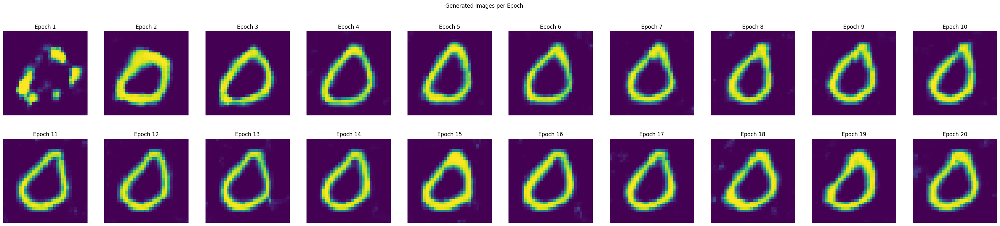

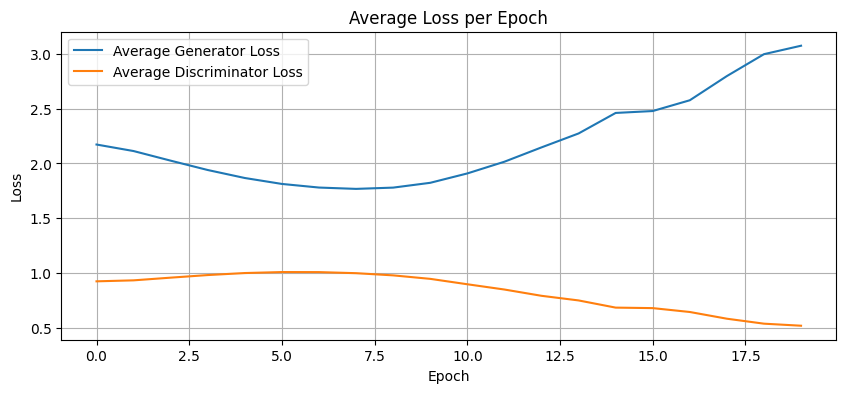

In [188]:
# Assuming generated_images is a list of batched tensors
cpu_generated_images = [img.cpu().detach() for img in generated_images] 

# Adjust for the number of channels and remove the batch dimension if present
for i, img in enumerate(cpu_generated_images):
    if img.ndim == 4 and img.shape[1] == 3:  # 4D Tensor with 3 channels
        # Select the first image in the batch and transpose it to (H, W, C)
        cpu_generated_images[i] = img[0].numpy().transpose(1, 2, 0)
    elif img.ndim == 4 and img.shape[1] == 1:  # 4D Tensor with 1 channel
        # Select the first image in the batch and remove the channel dimension
        cpu_generated_images[i] = img[0].squeeze(0).numpy()

plot_gan_training(cpu_generated_images, g_losses, d_losses, None, show_animation=False, save=True, every_nth_epoch=1, nrows=2, ncols=10)


## 4.2 Testing
Visualization of the impact of z on generation. All digits in the same column have the same noise vector z.

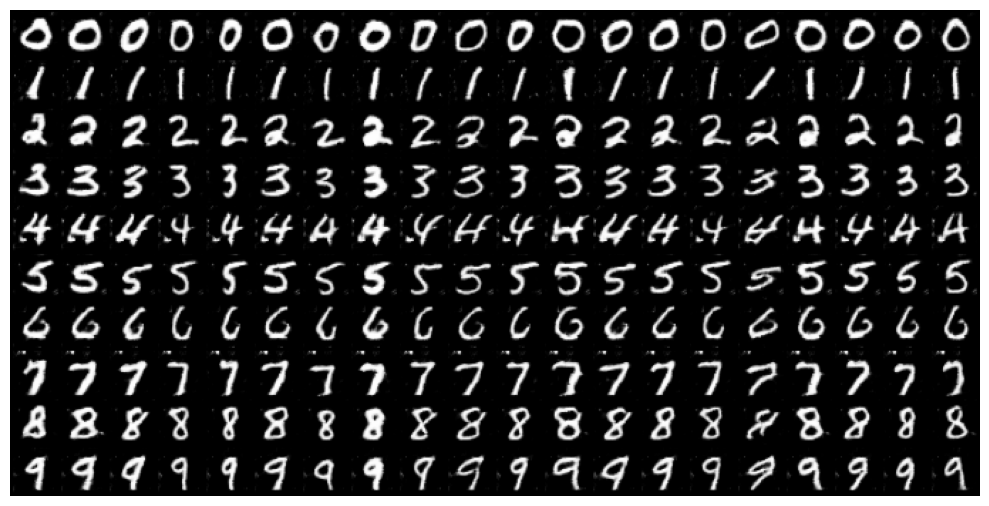

In [ ]:
n_ex = 20
n_classes = 10

z = sample_z(n_ex, nz).repeat(n_classes, 1) #.expand(10, nz)

netG.eval()

labels = torch.arange(n_classes).unsqueeze(0).reshape(-1, 1).repeat(1, n_ex).flatten().to(device)

ys = F.one_hot(labels).float()
fake_ims = netG(z, ys)

un_norm= renorm(fake_ims) # for visualization
grid = torchvision.utils.make_grid(un_norm, nrow=n_ex)
pil_grid = to_pil(grid)

plt.imshow(pil_grid)
plt.axis('off')
plt.tight_layout()

plt.savefig("figures/cGAN_MNIST.pdf", format='pdf')
plt.show()


## 4.3 Testing cGAN with CelebA

In [114]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Transformations for CelebA dataset
transform = transforms.Compose([
    transforms.Resize(32),
    transforms.CenterCrop(32),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load CelebA dataset labeled by SMILING
celeba_dataset = datasets.CelebA(root='.', split='train', download=False, transform=transform, target_type="attr")

# Get the total number of samples in the CelebA dataset
total_samples = len(celeba_dataset)

# Define the number of samples we want to randomly select
desired_num_samples = 50000

# Randomly select indices for the desired number of samples
selected_indices = random.sample(range(total_samples), desired_num_samples)

# Create a Subset of the CelebA dataset with the selected indices
subset_celeba_dataset = torch.utils.data.Subset(celeba_dataset, selected_indices)

# Create DataLoader for the subset dataset
celeba_dataloader = DataLoader(subset_celeba_dataset, batch_size=128, shuffle=True)



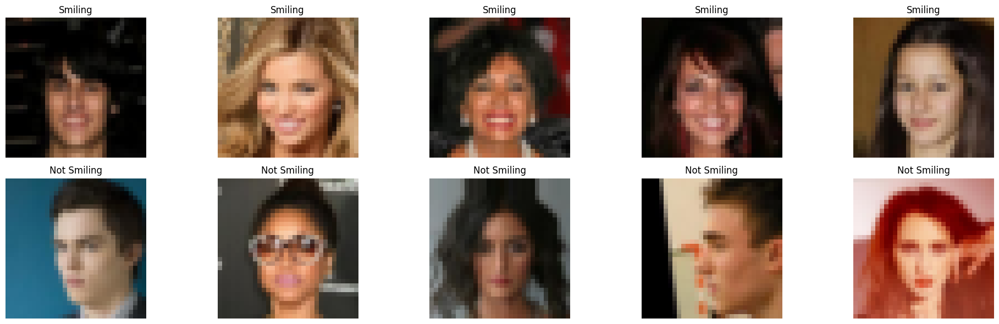

In [117]:
# Extract a batch of images and their corresponding labels
images, labels = next(iter(celeba_dataloader))

# Display some images with 'Smiling' and 'Not Smiling' labels
# 'Smiling' is the 31st attribute in CelebA
smiling_idx = 31

fig, ax = plt.subplots(2, 5, figsize=(20, 6))
for i in range(5):
    # Display 'Smiling' images
    idx = (labels[:, smiling_idx] == 1).nonzero(as_tuple=True)[0][i]
    img = images[idx].permute(1, 2, 0) * 0.5 + 0.5  # Unnormalize
    ax[0, i].imshow(img)
    ax[0, i].set_title('Smiling')
    ax[0, i].axis('off')

    # Display 'Not Smiling' images
    idx = (labels[:, smiling_idx] == 0).nonzero(as_tuple=True)[0][i]
    img = images[idx].permute(1, 2, 0) * 0.5 + 0.5  # Unnormalize
    ax[1, i].imshow(img)
    ax[1, i].set_title('Not Smiling')
    ax[1, i].axis('off')

plt.tight_layout()
plt.show()

In [118]:
def train_cgan_celebA(netG, netD, dataloader, nz, nc, criterion, g_opt, d_opt, nb_epochs=10, device='cpu', id_att=31):
    """
    Train a conditional GAN network on celebA dataset

    Args:
        netG (nn.Module): Conditional Generator network.
        netD (nn.Module): Conditional Discriminator network.
        dataloader (DataLoader): DataLoader for the dataset.
        nz (int): Size of the latent vector.
        nc (int): Number of classes (size of one-hot vector).
        criterion (loss function): Loss function for training.
        g_opt (optimizer): Optimizer for the generator.
        d_opt (optimizer): Optimizer for the discriminator.
        nb_epochs (int): Number of training epochs.
        device (str): Device to run the training on.
        id_att (int): ID of attribute in celebA dataset we want to condition the GAN on.

    Returns:
        tuple: Tuple containing the lists of generator losses, discriminator losses,
               and generated images per epoch.
    """

    avg_g_losses, avg_d_losses, epoch_images = [], [], []
    z_test = torch.randn(64, nz, device=device)  # Sample noise for testing

    for epoch in range(nb_epochs):
        g_losses, d_losses = [], []

        pbar = tqdm(enumerate(dataloader))
        for i, (im, labels) in pbar:
            im, labels = im.to(device), labels.to(device)
            
            ########## THE MAIN CHANGE IS HERE #############################################
            labels = labels[:, id_att]  
            ################################################################################


            # One-hot encode the labels
            y = F.one_hot(labels, num_classes=nc).float()

            # Sample noise vector z
            z = torch.randn(im.shape[0], nz, device=device)
            
            # Generate fake images
            fake_images = netG(z, y)

            # Classify real and fake images with Discriminator
            real_output = netD(im, y).view(-1)
            fake_output = netD(fake_images.detach(), y).view(-1)

            # Real image loss
            real_loss = criterion(real_output, torch.ones_like(real_output))

            # Fake image loss
            fake_loss = criterion(fake_output, torch.zeros_like(fake_output))

            # Discriminator loss
            d_loss = real_loss + fake_loss
            d_opt.zero_grad()
            d_loss.backward()
            d_opt.step()

            # Generator loss
            output = netD(fake_images, y).view(-1)
            g_loss = criterion(output, torch.ones_like(output))
            g_opt.zero_grad()
            g_loss.backward()
            g_opt.step()

            # Save Metrics
            d_losses.append(d_loss.item())
            g_losses.append(g_loss.item())

            pbar.set_description(f"Epoch [{epoch+1}/{nb_epochs}] - D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

        # Store average losses for this epoch
        avg_d_losses.append(torch.mean(torch.FloatTensor(d_losses)))
        avg_g_losses.append(torch.mean(torch.FloatTensor(g_losses)))

        # Generate and store images at the end of the epoch
        with torch.no_grad():
            fixed_labels = torch.arange(0, nc).repeat(64 // nc + 1)[:64].to(device)
            fixed_y = F.one_hot(fixed_labels, num_classes=nc).float()
            epoch_fake_images = netG(z_test, fixed_y)
            epoch_images.append(epoch_fake_images)


    return avg_g_losses, avg_d_losses, epoch_images



In [124]:
# Define the training parameters
nz = 100        # Size of z latent vector
nc = 2          # Number of classes in the dataset (e.g., MNIST has 10 digits)
ngf = 32        # nb of feature maps in generator
ndf = 32        # nb of feature maps in discriminator
nchannels = 3   # Number of channels in the training images
lr_d = 0.0002   # Learning rate for discriminator
lr_g = 0.0005   # Learning rate for generator
beta1 = 0.5     # Beta1 hyperparam for Adam optimizers
nb_epochs = 20  # Number of epochs to train for

# Initialize the network
netD = ConditionalDiscriminator(ndf, nc, nchannels).to(device)
netG = ConditionalGenerator(nz, nc, ngf, nchannels).to(device)

# Apply the weights_init function to randomly initialize all weights
netG.apply(weights_init)
netD.apply(weights_init)

# Set up the optimizers
g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

# Loss function
criterion = nn.BCELoss()

In [125]:
g_losses, d_losses, generated_images = train_cgan_celebA(netG, netD, celeba_dataloader, nz, nc, 
                                                  criterion, g_opt, d_opt, nb_epochs, device, 
                                                  id_att=31) # 31 is the id of SMILING attribute


Epoch [1/20] - D Loss: 0.7313, G Loss: 3.1669: : 391it [00:29, 13.33it/s]
Epoch [2/20] - D Loss: 1.0105, G Loss: 2.0872: : 391it [00:29, 13.10it/s]
Epoch [3/20] - D Loss: 1.3167, G Loss: 2.7593: : 391it [00:30, 12.86it/s]
Epoch [4/20] - D Loss: 1.1076, G Loss: 1.5718: : 391it [00:30, 12.83it/s]
Epoch [5/20] - D Loss: 0.8307, G Loss: 2.0916: : 391it [00:29, 13.23it/s]
Epoch [6/20] - D Loss: 1.2395, G Loss: 0.9699: : 391it [00:30, 12.96it/s]
Epoch [7/20] - D Loss: 1.1187, G Loss: 1.9143: : 391it [00:30, 12.93it/s]
Epoch [8/20] - D Loss: 1.0492, G Loss: 1.3559: : 391it [00:44,  8.75it/s]
Epoch [9/20] - D Loss: 1.0994, G Loss: 1.4408: : 391it [00:30, 12.67it/s]
Epoch [10/20] - D Loss: 1.3371, G Loss: 1.0382: : 391it [00:30, 12.94it/s]
Epoch [11/20] - D Loss: 2.1755, G Loss: 0.5062: : 391it [00:30, 12.91it/s]
Epoch [12/20] - D Loss: 1.3108, G Loss: 1.0543: : 391it [00:29, 13.36it/s]
Epoch [13/20] - D Loss: 0.8848, G Loss: 1.7765: : 391it [00:30, 12.80it/s]
Epoch [14/20] - D Loss: 1.0675, G 

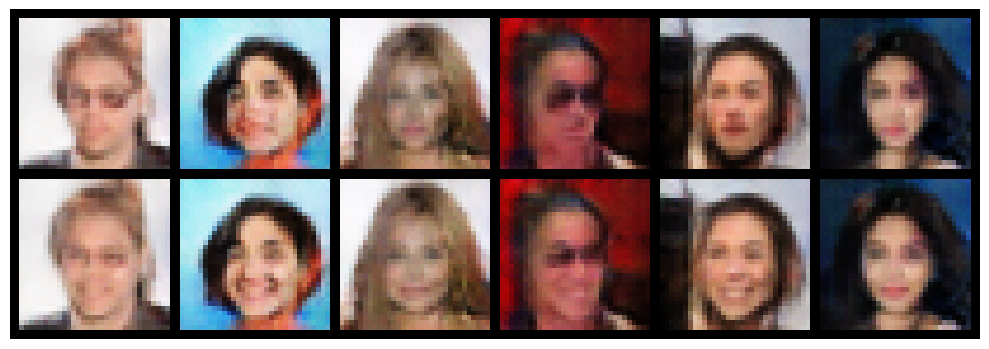

In [159]:
n_ex = 6  # Number of examples to generate
n_classes = 2  # Number of classes (smiling, not smiling)

z = sample_z(n_ex, nz).repeat(n_classes, 1)  # Generate noise vectors

netG.eval()  # Set the generator to evaluation mode

# Generate labels for smiling (1) and not smiling (0)
labels = torch.arange(n_classes).unsqueeze(0).repeat(n_ex, 1).t().flatten().to(device)

ys = F.one_hot(labels, num_classes=n_classes).float().to(device)  # One-hot encode the labels
fake_ims = netG(z, ys)  # Generate fake images conditioned on the labels

# Denormalize and visualize the generated images
un_norm = renorm(fake_ims)  # Denormalization for visualization
grid = torchvision.utils.make_grid(un_norm, nrow=n_ex)
pil_grid = to_pil(grid)

plt.imshow(pil_grid)
plt.axis('off')
plt.tight_layout()
plt.savefig("figures/cGAN_CelebA_Smiling.pdf", format='pdf')
plt.show()
